In [ ]:
import glob
import random
from pathlib import Path
from tqdm.notebook import tqdm

import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt
from transformers import Sam3Processor, Sam3Model

from kaggle_secrets import UserSecretsClient
from huggingface_hub import login

user_secrets = UserSecretsClient()
login(token=user_secrets.get_secret("HF_TOKEN"))

IMAGES_ROOT = "/kaggle/input/datasets/kushagrapandya/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/images"
RANDOM_SEED = 42
PROMPT = "photo taken at night"
MODEL_NAME = "facebook/sam3"

random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

In [ ]:
all_images = sorted(
    glob.glob(f"{IMAGES_ROOT}/**/*.jpg", recursive=True)
    + glob.glob(f"{IMAGES_ROOT}/**/*.jpeg", recursive=True)
    + glob.glob(f"{IMAGES_ROOT}/**/*.png", recursive=True)
)
print(f"{len(all_images)} images trouvées sous {IMAGES_ROOT}")

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device utilisé : {device}")

model = Sam3Model.from_pretrained(MODEL_NAME).to(device).eval()
processor = Sam3Processor.from_pretrained(MODEL_NAME)

In [ ]:
results = []

for path in tqdm(all_images, desc="Analyse des images"):
    image = Image.open(path).convert("RGB")
    inputs = processor(images=image, text=PROMPT, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)

    # Score global : le concept est-il présent quelque part dans l'image ?
    presence_score = torch.sigmoid(outputs.presence_logits).item()

    results.append({"path": path, "presence_score": presence_score})

results.sort(key=lambda r: r["presence_score"], reverse=True)
print(f'\nRésultats pour le prompt "{PROMPT}" :')

scores = np.array([r["presence_score"] for r in results])
print(
    f"\nScore moyen : {scores.mean():.3f}  |  min={scores.min():.3f}  max={scores.max():.3f}"
)


In [ ]:
import pandas as pd

df = pd.DataFrame(results)
df["label"] = df["presence_score"].apply(lambda score: "nuit" if score >= 0.3 else "jour")
df.to_csv("Visdrone_night_day.csv", index=False)
print(df["label"].value_counts())
df.head()

In [ ]:
sample_results = random.sample(results, 200)
n_cols = 5
n_rows = (len(sample_results) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 2.2))
axes = axes.flatten()
for ax, r in zip(axes, sample_results):
    img = Image.open(r["path"]).convert("RGB")
    ax.imshow(img)
    ax.set_title(f"{r['presence_score']:.2f}", fontsize=8)
    ax.axis("off")
for ax in axes[len(sample_results):]:
    ax.axis("off")
plt.suptitle(f'Images triées par score de présence "{PROMPT}" (SAM 3)')
plt.tight_layout()

plt.show()

Retenue pour la séparation jour / nuit

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

folder_path = "/kaggle/input/datasets/kushagrapandya/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/images"
all_files = sorted(
    [
        f
        for f in os.listdir(folder_path)
        if f.lower().endswith((".png", ".jpg", ".jpeg"))
    ]
)
images_to_show = all_files[:200]

imgs_per_row = 5
num_rows = (len(images_to_show) + imgs_per_row - 1) // imgs_per_row

fig, axes = plt.subplots(num_rows, imgs_per_row, figsize=(20, 4 * num_rows))
axes = axes.flatten()

for idx, file_name in enumerate(images_to_show):
    img_path = os.path.join(folder_path, file_name)
    img = Image.open(img_path)

    axes[idx].imshow(img)
    axes[idx].set_title(file_name, fontsize=8, pad=5)
    axes[idx].axis("off")

for j in range(len(images_to_show), len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


Modele physique de diffusion atmospherique (Koschmieder / ASM)
==================================================================
Modele standard utilise dans la quasi-totalite de la litterature
dehazing/fog synthesis (Foggy Cityscapes, HazyDet, SateHaze1k, etc.) :

    I(x) = J(x) * t(x) + A * (1 - t(x))
    t(x) = exp(-beta * d(x))

- I(x) : image observee (avec brouillard)
- J(x) : image de la scene claire (sans brouillard)
- A    : lumiere atmospherique (couleur du voile, ~gris-blanc)
- beta : coefficient d'extinction (densite globale du brouillard)
- d(x) : carte de profondeur / d'epaisseur optique du brouillard
- t(x) : transmission directe (fraction de J qui atteint la camera)

Pour une vue aerienne, d(x) est remplace par un champ de bruit fractal
(nappes irregulieres) plutot qu'un gradient de profondeur geometrique,
conformement a l'approche utilisee dans la litterature satellite/UAV
(SateHaze1k, RSHD - cf. compte-rendu bibliographique precedent).

GPU CUDA détecté : Tesla T4

Image : 1360 × 765

Chargement de Depth Anything V2...


Loading weights:   0%|          | 0/287 [00:00<?, ?it/s]


GÉNÉRATION DU BROUILLARD DIURNE

F5_very_very_dense   strength=0.95 heterogeneity=0.25
F1_light             strength=0.22 heterogeneity=0.08
F2_light_medium      strength=0.35 heterogeneity=0.10
F3_medium            strength=0.50 heterogeneity=0.13
F4_dense             strength=0.68 heterogeneity=0.17
F5_very_dense        strength=0.85 heterogeneity=0.21


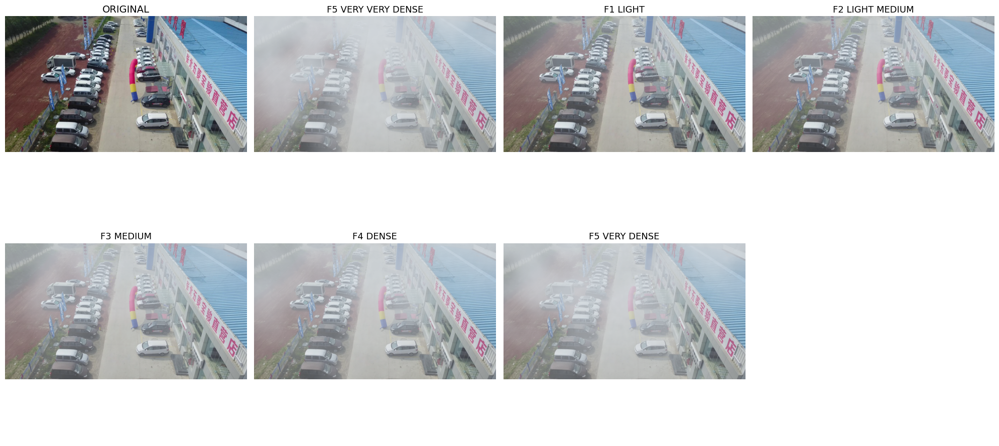

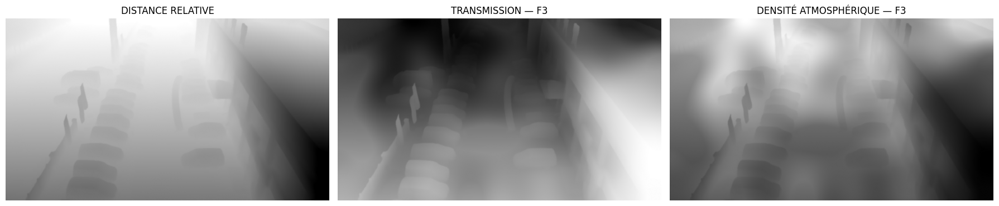


STATISTIQUES DE TRANSMISSION

F5_very_very_dense
  min     : 0.0303
  moyen   : 0.3692
  médiane : 0.3105
  max     : 0.9824

F1_light
  min     : 0.4303
  moyen   : 0.7135
  médiane : 0.7217
  max     : 0.9892

F2_light_medium
  min     : 0.3512
  moyen   : 0.6299
  médiane : 0.6104
  max     : 0.9860

F3_medium
  min     : 0.1812
  moyen   : 0.5448
  médiane : 0.5484
  max     : 0.9863

F4_dense
  min     : 0.1502
  moyen   : 0.4672
  médiane : 0.4540
  max     : 0.9794

F5_very_dense
  min     : 0.0769
  moyen   : 0.4057
  médiane : 0.3614
  max     : 0.9747

TERMINÉ

Résultats disponibles dans : fog_results_v2/

Fichiers générés :
  - F0 ... F5 : images brouillées
  - *_transmission.png : cartes T
  - *_density.png : cartes de densité
  - depth_fog.png : profondeur relative
  - fog_comparison.jpg : comparaison
  - physical_maps.jpg : cartes physiques


In [4]:
# ================================================================
# GÉNÉRATEUR DE BROUILLARD DIURNE RÉALISTE
# Pour dataset de restauration d'image + détection d'objets
#
# Principe :
#
#       IMAGE CLAIRE
#            │
#            ├── Depth Anything V2
#            │
#            ├── densité globale
#            │
#            ├── champ spatial de brouillard
#            │
#            ├── profondeur
#            │
#            └── diffusion atmosphérique
#                    │
#                    ▼
#             IMAGE BROUILLÉE
#
# IMPORTANT :
# La géométrie de l'image originale n'est jamais modifiée.
# ================================================================

import os
import gc
import math
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

from PIL import Image
from transformers import AutoImageProcessor, AutoModelForDepthEstimation

IMAGE_PATH = (
    "/kaggle/input/datasets/kushagrapandya/"
    "visdrone-dataset/VisDrone2019-DET-train/"
    "VisDrone2019-DET-train/images/"
    "0000007_05999_d_0000038.jpg"
)

OUTPUT_DIR = "fog_results_v2"
os.makedirs(OUTPUT_DIR, exist_ok=True)

DEPTH_MODEL = "depth-anything/Depth-Anything-V2-Small-hf"

GLOBAL_SEED = 42

if torch.cuda.is_available():
    DEVICE = "cuda"
    print("GPU CUDA détecté :", torch.cuda.get_device_name(0))
else:
    DEVICE = "cpu"
    print("⚠️ GPU CUDA non détecté.")

DEPTH_DTYPE = torch.float16 if DEVICE == "cuda" else torch.float32

image_bgr = cv2.imread(IMAGE_PATH)

if image_bgr is None:
    raise FileNotFoundError(f"Impossible de charger : {IMAGE_PATH}")

image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
H, W = image_rgb.shape[:2]

print(f"\nImage : {W} × {H}")

print("\nChargement de Depth Anything V2...")

processor = AutoImageProcessor.from_pretrained(DEPTH_MODEL)
depth_model = AutoModelForDepthEstimation.from_pretrained(DEPTH_MODEL).to(DEVICE)
depth_model.eval()

pil_image = Image.fromarray(image_rgb)
inputs = processor(images=pil_image, return_tensors="pt")
inputs = {k: v.to(DEVICE) for k, v in inputs.items()}

with torch.no_grad():
    outputs = depth_model(**inputs)
    predicted_depth = outputs.predicted_depth
    predicted_depth = torch.nn.functional.interpolate(
        predicted_depth.unsqueeze(1),
        size=(H, W),
        mode="bicubic",
        align_corners=False
    ).squeeze()

depth = predicted_depth.detach().float().cpu().numpy()

p1 = np.percentile(depth, 1)
p99 = np.percentile(depth, 99)

depth = (depth - p1) / (p99 - p1 + 1e-8)
depth = np.clip(depth, 0, 1)

# ================================================================
# IMPORTANT
#
# Depth Anything V2 :
#
# valeur forte → généralement proche
# valeur faible → généralement loin
#
# Pour le brouillard :
#
# 0 = proche
# 1 = loin
# ================================================================

depth_fog = 1.0 - depth

# léger lissage
depth_fog = cv2.GaussianBlur(depth_fog.astype(np.float32), (0, 0), sigmaX=1.5)
depth_fog = np.clip(depth_fog, 0, 1)


depth_vis = (depth_fog * 255).astype(np.uint8)
cv2.imwrite(os.path.join(OUTPUT_DIR, "depth_fog.png"), depth_vis)


def create_fog_field(H, W, strength, heterogeneity, seed=42):
    """
    Génère un champ spatial basse fréquence.

    Contrairement à un simple gradient vertical,
    le brouillard varie spatialement.

    Le champ est suffisamment lisse pour éviter
    des artefacts artificiels.
    """

    rng = np.random.default_rng(seed)
    
    # Bruit basse fréquence
    noise = rng.normal(0, 1, (H, W)).astype(np.float32)
    sigma = max(20, min(H, W) / 12)
    noise = cv2.GaussianBlur(noise, (0, 0), sigmaX=sigma)

    # normalisation
    noise -= noise.min()
    noise /= (noise.max() + 1e-8)

    # Deuxième échelle de variation

    noise2 = rng.normal(0, 1, (H, W)).astype(np.float32)
    sigma2 = max(50, min(H, W) / 5)
    noise2 = cv2.GaussianBlur(noise2, (0, 0), sigmaX=sigma2)

    noise2 -= noise2.min()
    noise2 /= (noise2.max() + 1e-8)

    # combinaison des échelles
    field = 0.70 * noise + 0.30 * noise2
    field -= field.mean()
    field /= (np.std(field) + 1e-8)

    # variation autour de 1
    field = 1.0 + heterogeneity * field

    # empêcher les valeurs extrêmes
    field = np.clip(field, 1.0 - 1.5 * heterogeneity, 1.0 + 1.5 * heterogeneity)

    return field.astype(np.float32)



def create_density_map(depth, strength, heterogeneity, seed=42):
    """
    Génère une densité de brouillard plus réaliste.

    La densité possède trois composantes :

        1. densité minimale globale
        2. profondeur
        3. hétérogénéité spatiale

    Le premier plan n'est donc plus totalement exempt
    de brouillard.
    """

    H, W = depth.shape

    spatial_field = create_fog_field(H, W, strength, heterogeneity, seed)

    # ------------------------------------------------------------
    # Densité de base
    #
    # Même à distance faible, il existe une quantité
    # minimale de voile atmosphérique.
    # ------------------------------------------------------------

    base_density = 0.025 + 0.14 * strength

    # ------------------------------------------------------------
    # Contribution de la profondeur
    #
    # progressive et non linéaire
    # ------------------------------------------------------------

    depth_component = depth ** 1.35
    depth_density = (0.20 + 2.30 * strength) * depth_component

    # ------------------------------------------------------------
    # densité totale
    # ------------------------------------------------------------

    density = base_density + depth_density

    # application du champ spatial
    density *= spatial_field

    # ------------------------------------------------------------
    # petit plafond de sécurité
    # ------------------------------------------------------------

    density = np.clip(density, 0, 8.0)

    return density.astype(np.float32)


# ================================================================
# 9. TRANSMISSION
# ================================================================

def create_transmission(depth, strength, heterogeneity, seed=42):
    """
    Modèle Beer-Lambert :

        T = exp(-beta * d)

    MAIS avec une densité atmosphérique
    qui existe également au premier plan.
    """

    density = create_density_map(depth, strength, heterogeneity, seed)

    # ------------------------------------------------------------
    # Distance atmosphérique effective
    # ------------------------------------------------------------

    # On ajoute une petite composante globale.
    #
    # Cela évite que les objets proches restent
    # complètement exempts de voile.

    effective_distance = 0.18 + 0.82 * depth
    optical_depth = density * effective_distance

    T = np.exp(-optical_depth)
    T = np.clip(T, 0.02, 1.0)

    return T.astype(np.float32)


# ================================================================
# 10. LUMIÈRE ATMOSPHÉRIQUE DIURNE
# ================================================================

def estimate_atmospheric_light(image, strength):
    """
    Estimation de A.

    Pour une scène diurne :

        A ≈ lumière diffuse du ciel /
            environnement atmosphérique.

    On évite un blanc pur artificiel.
    """

    img = image.astype(np.float32) / 255.0

    # luminosité
    brightness = (
        0.299 * img[:, :, 0]
        + 0.587 * img[:, :, 1]
        + 0.114 * img[:, :, 2]
    )

    # pixels lumineux
    threshold = np.percentile(brightness, 97)
    mask = brightness >= threshold

    if np.sum(mask) > 100:
        A = img[mask].mean(axis=0)
    else:
        A = np.array([0.82, 0.85, 0.88], dtype=np.float32)

    # ------------------------------------------------------------
    # atmosphère diurne légèrement froide/neutre
    # ------------------------------------------------------------

    daylight = np.array([0.84, 0.87, 0.90], dtype=np.float32)
    A = 0.70 * A + 0.30 * daylight

    # densité forte → atmosphère plus dominante
    A = (1 - 0.20 * strength) * A + (0.20 * strength) * daylight

    return np.clip(A, 0, 1)


# ================================================================
# 11. APPLICATION DU BROUILLARD
# ================================================================

def apply_physical_fog(image, depth, strength, heterogeneity, seed=42):
    """
    Modèle atmosphérique :

        I = J*T + A*(1-T)
    """

    J = image.astype(np.float32) / 255.0

    # ------------------------------------------------------------
    # transmission
    # ------------------------------------------------------------

    T = create_transmission(depth, strength, heterogeneity, seed)

    # ------------------------------------------------------------
    # lumière atmosphérique
    # ------------------------------------------------------------

    A = estimate_atmospheric_light(image, strength)

    # ------------------------------------------------------------
    # application
    # ------------------------------------------------------------

    T3 = T[:, :, None]
    fog = J * T3 + A[None, None, :] * (1.0 - T3)
    fog = np.clip(fog, 0, 1)

    return (fog * 255).astype(np.uint8), T


# ================================================================
# 12. VOILE ATMOSPHÉRIQUE DIURNE
# ================================================================

def add_daylight_veil(image, strength, seed=42):
    """
    Ajoute une très légère composante de voile
    atmosphérique.

    Ce n'est PAS un glow.

    On modifie principalement :
        - contraste
        - saturation
        - luminosité

    sans déplacer les objets.
    """

    img = image.astype(np.float32) / 255.0

    # ------------------------------------------------------------
    # Conversion HSV
    # ------------------------------------------------------------

    hsv = cv2.cvtColor(img.astype(np.float32), cv2.COLOR_RGB2HSV)

    # ------------------------------------------------------------
    # réduction progressive de saturation
    # ------------------------------------------------------------

    saturation_factor = 1.0 - 0.18 * strength
    hsv[:, :, 1] *= saturation_factor

    # ------------------------------------------------------------
    # très légère réduction de contraste
    # ------------------------------------------------------------

    contrast_factor = 1.0 - 0.10 * strength
    hsv[:, :, 2] = 0.5 + contrast_factor * (hsv[:, :, 2] - 0.5)

    result = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

    # ------------------------------------------------------------
    # légère composante lumineuse diffuse
    # ------------------------------------------------------------

    atmospheric = np.array([0.84, 0.87, 0.90], dtype=np.float32)
    veil_strength = 0.025 + 0.045 * strength

    result = (1 - veil_strength) * result + veil_strength * atmospheric

    return (np.clip(result, 0, 1) * 255).astype(np.uint8)


# ================================================================
# 13. MICRO VARIATION ATMOSPHÉRIQUE
# ================================================================

def add_subtle_atmospheric_variation(image, strength, seed=123):
    """
    Variation extrêmement légère.

    Elle évite que toutes les zones de brouillard
    aient exactement le même aspect.

    Elle reste volontairement faible pour ne pas
    détruire les détails des objets.
    """

    rng = np.random.default_rng(seed)
    H, W = image.shape[:2]

    noise = rng.normal(0, 1, (H, W)).astype(np.float32)
    noise = cv2.GaussianBlur(noise, (0, 0), sigmaX=10)
    noise /= (np.std(noise) + 1e-8)

    amplitude = 0.25 + 0.60 * strength

    result = image.astype(np.float32) + noise[:, :, None] * amplitude

    return np.clip(result, 0, 255).astype(np.uint8)


# ================================================================
# 14. NIVEAUX DE BROUILLARD
# ================================================================
#
# Ces niveaux sont volontairement plus progressifs.
#
# F0 : pratiquement pas de brouillard
# F1 : léger
# F2 : léger à moyen
# F3 : moyen
# F4 : dense
# F5 : très dense
#
# Le brouillard existe à toutes les profondeurs.
# ================================================================

FOG_LEVELS = {
   "F5_very_very_dense":   {"strength": 0.95, "heterogeneity": 0.25, "seed": 101},
    "F1_light":        {"strength": 0.22, "heterogeneity": 0.08, "seed": 102},
    "F2_light_medium": {"strength": 0.35, "heterogeneity": 0.10, "seed": 103},
    "F3_medium":       {"strength": 0.50, "heterogeneity": 0.13, "seed": 104},
    "F4_dense":        {"strength": 0.68, "heterogeneity": 0.17, "seed": 105},
    "F5_very_dense":   {"strength": 0.85, "heterogeneity": 0.21, "seed": 106},
}


# ================================================================
# 15. GÉNÉRATION
# ================================================================

results = {}
transmissions = {}
densities = {}

print("\n================================================")
print("GÉNÉRATION DU BROUILLARD DIURNE")
print("================================================\n")

for name, params in FOG_LEVELS.items():

    strength = params["strength"]
    heterogeneity = params["heterogeneity"]
    seed = params["seed"]

    print(f"{name:20s} strength={strength:.2f} heterogeneity={heterogeneity:.2f}")

    # ------------------------------------------------------------
    # brouillard physique
    # ------------------------------------------------------------

    fog, T = apply_physical_fog(image_rgb, depth_fog, strength, heterogeneity, seed)

    # ------------------------------------------------------------
    # voile diurne
    # ------------------------------------------------------------

    fog = add_daylight_veil(fog, strength, seed)

    # ------------------------------------------------------------
    # variation atmosphérique très légère
    # ------------------------------------------------------------

    fog = add_subtle_atmospheric_variation(fog, strength, seed + 1000)

    # ------------------------------------------------------------
    # stockage
    # ------------------------------------------------------------

    results[name] = fog
    transmissions[name] = T
    densities[name] = create_density_map(depth_fog, strength, heterogeneity, seed)

    # ------------------------------------------------------------
    # sauvegarde image
    # ------------------------------------------------------------

    output_path = os.path.join(OUTPUT_DIR, f"{name}.jpg")
    Image.fromarray(fog).save(output_path, quality=95)

    # ------------------------------------------------------------
    # sauvegarde transmission
    # ------------------------------------------------------------

    transmission_path = os.path.join(OUTPUT_DIR, f"{name}_transmission.png")
    cv2.imwrite(transmission_path, (T * 255).astype(np.uint8))

    # ------------------------------------------------------------
    # sauvegarde densité
    # ------------------------------------------------------------

    density = densities[name]
    density_norm = (density - density.min()) / (density.max() - density.min() + 1e-8)

    cv2.imwrite(
        os.path.join(OUTPUT_DIR, f"{name}_density.png"),
        (density_norm * 255).astype(np.uint8)
    )


# ================================================================
# 16. COMPARAISON VISUELLE
# ================================================================

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

# ------------------------------------------------
# original
# ------------------------------------------------

axes[0].imshow(image_rgb)
axes[0].set_title("ORIGINAL", fontsize=14)
axes[0].axis("off")

# ------------------------------------------------
# niveaux brouillard
# ------------------------------------------------

for ax, (name, img) in zip(axes[1:], results.items()):
    ax.imshow(img)
    ax.set_title(name.replace("_", " ").upper(), fontsize=13)
    ax.axis("off")

# ------------------------------------------------
# supprimer axes inutilisés
# ------------------------------------------------

for ax in axes[1 + len(results):]:
    ax.axis("off")

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "fog_comparison.jpg"), dpi=150)
plt.show()


# ================================================================
# 17. PROFONDEUR + TRANSMISSION
# ================================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# profondeur
axes[0].imshow(depth_fog, cmap="gray")
axes[0].set_title("DISTANCE RELATIVE")
axes[0].axis("off")

# transmission moyenne
T_medium = transmissions["F3_medium"]
axes[1].imshow(T_medium, cmap="gray")
axes[1].set_title("TRANSMISSION — F3")
axes[1].axis("off")

# densité moyenne
density_medium = densities["F3_medium"]
axes[2].imshow(density_medium, cmap="gray")
axes[2].set_title("DENSITÉ ATMOSPHÉRIQUE — F3")
axes[2].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "physical_maps.jpg"), dpi=150)
plt.show()


# ================================================================
# 18. ANALYSE SIMPLE DES TRANSMISSIONS
# ================================================================

print("\n================================================")
print("STATISTIQUES DE TRANSMISSION")
print("================================================")

for name, T in transmissions.items():
    print(f"\n{name}")
    print(f"  min     : {T.min():.4f}")
    print(f"  moyen   : {T.mean():.4f}")
    print(f"  médiane : {np.median(T):.4f}")
    print(f"  max     : {T.max():.4f}")


# ================================================================
# 19. NETTOYAGE
# ================================================================

del depth_model
del processor

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


# ================================================================
# FIN
# ================================================================

print("\n================================================")
print("TERMINÉ")
print("================================================")
print(f"\nRésultats disponibles dans : {OUTPUT_DIR}/")
print("\nFichiers générés :")
print("  - F0 ... F5 : images brouillées")
print("  - *_transmission.png : cartes T")
print("  - *_density.png : cartes de densité")
print("  - depth_fog.png : profondeur relative")
print("  - fog_comparison.jpg : comparaison")
print("  - physical_maps.jpg : cartes physiques")

Retenue pour le brouillard

GPU CUDA détecté : Tesla T4

Image : 1360 × 765

Chargement de Depth Anything V2...


Loading weights:   0%|          | 0/287 [00:00<?, ?it/s]


GÉNÉRATION DU BROUILLARD DIURNE

F0_very_light        strength=0.10 heterogeneity=0.06
[[0.43558416 0.4355762  0.43547434 ... 0.3486934  0.34997767 0.35059184]
 [0.43545645 0.43545142 0.43536288 ... 0.34845638 0.34956595 0.35009396]
 [0.43504816 0.4350535  0.43500793 ... 0.3478932  0.34860888 0.34894493]
 ...
 [0.16926545 0.16919105 0.16901383 ... 0.03549    0.03549    0.03549   ]
 [0.1693948  0.16931503 0.16911465 ... 0.03549    0.03549    0.03549   ]
 [0.16947594 0.16939327 0.1691822  ... 0.03549    0.03549    0.03549   ]]
[[0.43558416 0.4355762  0.43547434 ... 0.3486934  0.34997767 0.35059184]
 [0.43545645 0.43545142 0.43536288 ... 0.34845638 0.34956595 0.35009396]
 [0.43504816 0.4350535  0.43500793 ... 0.3478932  0.34860888 0.34894493]
 ...
 [0.16926545 0.16919105 0.16901383 ... 0.03549    0.03549    0.03549   ]
 [0.1693948  0.16931503 0.16911465 ... 0.03549    0.03549    0.03549   ]
 [0.16947594 0.16939327 0.1691822  ... 0.03549    0.03549    0.03549   ]]
F1_light             str

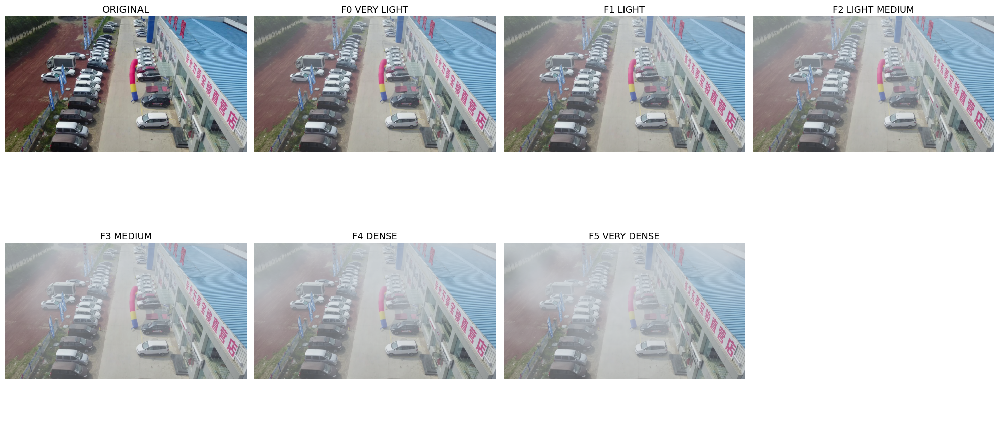

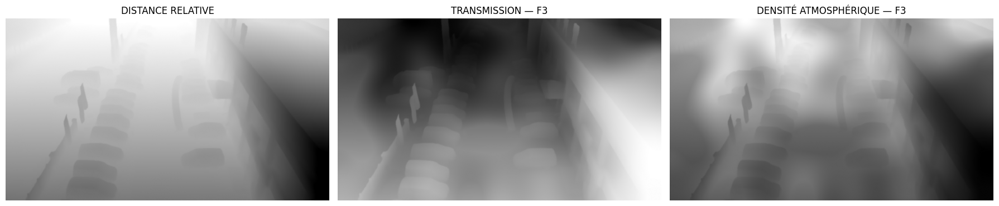


STATISTIQUES DE TRANSMISSION

F0_very_light
  min     : 0.5998
  moyen   : 0.8052
  médiane : 0.8098
  max     : 0.9936

F1_light
  min     : 0.4303
  moyen   : 0.7135
  médiane : 0.7217
  max     : 0.9892

F2_light_medium
  min     : 0.3512
  moyen   : 0.6299
  médiane : 0.6104
  max     : 0.9860

F3_medium
  min     : 0.1812
  moyen   : 0.5448
  médiane : 0.5484
  max     : 0.9863

F4_dense
  min     : 0.1502
  moyen   : 0.4672
  médiane : 0.4540
  max     : 0.9794

F5_very_dense
  min     : 0.0769
  moyen   : 0.4057
  médiane : 0.3614
  max     : 0.9747

TERMINÉ

Résultats disponibles dans : fog_results_v2/

Fichiers générés :
  - F0 ... F5 : images brouillées
  - *_transmission.png : cartes T
  - *_density.png : cartes de densité
  - depth_fog.png : profondeur relative
  - fog_comparison.jpg : comparaison
  - physical_maps.jpg : cartes physiques


In [9]:
# ================================================================
# GÉNÉRATEUR DE BROUILLARD DIURNE RÉALISTE
# Pour dataset de restauration d'image + détection d'objets
#
# Principe :
#
#       IMAGE CLAIRE
#            │
#            ├── Depth Anything V2
#            │
#            ├── densité globale
#            │
#            ├── champ spatial de brouillard
#            │
#            ├── profondeur
#            │
#            └── diffusion atmosphérique
#                    │
#                    ▼
#             IMAGE BROUILLÉE
#
# IMPORTANT :
# La géométrie de l'image originale n'est jamais modifiée.
# ================================================================

import os
import gc
import math
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

from PIL import Image
from transformers import AutoImageProcessor, AutoModelForDepthEstimation


# ================================================================
# 1. CONFIGURATION
# ================================================================

# >>> CHANGE THIS PATH <<<
IMAGE_PATH = (
    "/kaggle/input/datasets/kushagrapandya/"
    "visdrone-dataset/VisDrone2019-DET-train/"
    "VisDrone2019-DET-train/images/"
    "0000007_05999_d_0000038.jpg"
)

OUTPUT_DIR = "fog_results_v2"
os.makedirs(OUTPUT_DIR, exist_ok=True)


# ================================================================
# DEPTH ANYTHING V2
# ================================================================

DEPTH_MODEL = "depth-anything/Depth-Anything-V2-Small-hf"


# ================================================================
# SEED
# ================================================================

GLOBAL_SEED = 42


# ================================================================
# DEVICE
# ================================================================

if torch.cuda.is_available():
    DEVICE = "cuda"
    print("GPU CUDA détecté :", torch.cuda.get_device_name(0))
else:
    DEVICE = "cpu"
    print("⚠️ GPU CUDA non détecté.")

DEPTH_DTYPE = torch.float16 if DEVICE == "cuda" else torch.float32


# ================================================================
# 2. CHARGEMENT IMAGE
# ================================================================

image_bgr = cv2.imread(IMAGE_PATH)

if image_bgr is None:
    raise FileNotFoundError(f"Impossible de charger : {IMAGE_PATH}")

image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
H, W = image_rgb.shape[:2]

print(f"\nImage : {W} × {H}")


# ================================================================
# 3. DEPTH ANYTHING V2
# ================================================================

print("\nChargement de Depth Anything V2...")

processor = AutoImageProcessor.from_pretrained(DEPTH_MODEL)
depth_model = AutoModelForDepthEstimation.from_pretrained(DEPTH_MODEL).to(DEVICE)
depth_model.eval()


# ================================================================
# 4. ESTIMATION DE PROFONDEUR
# ================================================================

pil_image = Image.fromarray(image_rgb)
inputs = processor(images=pil_image, return_tensors="pt")
inputs = {k: v.to(DEVICE) for k, v in inputs.items()}

with torch.no_grad():
    outputs = depth_model(**inputs)
    predicted_depth = outputs.predicted_depth
    predicted_depth = torch.nn.functional.interpolate(
        predicted_depth.unsqueeze(1),
        size=(H, W),
        mode="bicubic",
        align_corners=False
    ).squeeze()

depth = predicted_depth.detach().float().cpu().numpy()


# ================================================================
# 5. NORMALISATION PROFONDEUR
# ================================================================

p1 = np.percentile(depth, 1)
p99 = np.percentile(depth, 99)

depth = (depth - p1) / (p99 - p1 + 1e-8)
depth = np.clip(depth, 0, 1)

# ================================================================
# IMPORTANT
#
# Depth Anything V2 :
#
# valeur forte → généralement proche
# valeur faible → généralement loin
#
# Pour le brouillard :
#
# 0 = proche
# 1 = loin
# ================================================================

depth_fog = 1.0 - depth

# léger lissage
depth_fog = cv2.GaussianBlur(depth_fog.astype(np.float32), (0, 0), sigmaX=1.5)
depth_fog = np.clip(depth_fog, 0, 1)


# ================================================================
# 6. SAUVEGARDE DEPTH
# ================================================================

depth_vis = (depth_fog * 255).astype(np.uint8)
cv2.imwrite(os.path.join(OUTPUT_DIR, "depth_fog.png"), depth_vis)


# ================================================================
# 7. CHAMP DE BROUILLARD SPATIAL
# ================================================================

def create_fog_field(H, W, strength, heterogeneity, seed=42):
    """
    Génère un champ spatial basse fréquence.

    Contrairement à un simple gradient vertical,
    le brouillard varie spatialement.

    Le champ est suffisamment lisse pour éviter
    des artefacts artificiels.
    """

    rng = np.random.default_rng(seed)

    # ------------------------------------------------------------
    # Bruit basse fréquence
    # ------------------------------------------------------------

    noise = rng.normal(0, 1, (H, W)).astype(np.float32)
    sigma = max(20, min(H, W) / 12)
    noise = cv2.GaussianBlur(noise, (0, 0), sigmaX=sigma)

    # normalisation
    noise -= noise.min()
    noise /= (noise.max() + 1e-8)

    # ------------------------------------------------------------
    # Deuxième échelle de variation
    # ------------------------------------------------------------

    noise2 = rng.normal(0, 1, (H, W)).astype(np.float32)
    sigma2 = max(50, min(H, W) / 5)
    noise2 = cv2.GaussianBlur(noise2, (0, 0), sigmaX=sigma2)

    noise2 -= noise2.min()
    noise2 /= (noise2.max() + 1e-8)

    # ------------------------------------------------------------
    # combinaison des échelles
    # ------------------------------------------------------------

    field = 0.70 * noise + 0.30 * noise2
    field -= field.mean()
    field /= (np.std(field) + 1e-8)

    # variation autour de 1
    field = 1.0 + heterogeneity * field

    # empêcher les valeurs extrêmes
    field = np.clip(field, 1.0 - 1.5 * heterogeneity, 1.0 + 1.5 * heterogeneity)

    return field.astype(np.float32)


# ================================================================
# 8. DENSITÉ ATMOSPHÉRIQUE
# ================================================================

def create_density_map(depth, strength, heterogeneity, seed=42):
    """
    Génère une densité de brouillard plus réaliste.

    La densité possède trois composantes :

        1. densité minimale globale
        2. profondeur
        3. hétérogénéité spatiale

    Le premier plan n'est donc plus totalement exempt
    de brouillard.
    """

    H, W = depth.shape

    # ------------------------------------------------------------
    # Champ spatial
    # ------------------------------------------------------------

    spatial_field = create_fog_field(H, W, strength, heterogeneity, seed)

    # ------------------------------------------------------------
    # Densité de base
    #
    # Même à distance faible, il existe une quantité
    # minimale de voile atmosphérique.
    # ------------------------------------------------------------

    base_density = 0.025 + 0.14 * strength

    # ------------------------------------------------------------
    # Contribution de la profondeur
    #
    # progressive et non linéaire
    # ------------------------------------------------------------

    depth_component = depth ** 1.35
    depth_density = (0.20 + 2.30 * strength) * depth_component

    # ------------------------------------------------------------
    # densité totale
    # ------------------------------------------------------------

    density = base_density + depth_density

    # application du champ spatial
    density *= spatial_field

    # ------------------------------------------------------------
    # petit plafond de sécurité
    # ------------------------------------------------------------
    density = np.clip(density, 0, 8.0)

    return density.astype(np.float32)


# ================================================================
# 9. TRANSMISSION
# ================================================================

def create_transmission(depth, strength, heterogeneity, seed=42):
    """
    Modèle Beer-Lambert :

        T = exp(-beta * d)

    MAIS avec une densité atmosphérique
    qui existe également au premier plan.
    """

    density = create_density_map(depth, strength, heterogeneity, seed)

    # ------------------------------------------------------------
    # Distance atmosphérique effective
    # ------------------------------------------------------------

    # On ajoute une petite composante globale.
    #
    # Cela évite que les objets proches restent
    # complètement exempts de voile.

    effective_distance = 0.18 + 0.82 * depth
    optical_depth = density * effective_distance

    T = np.exp(-optical_depth)
    T = np.clip(T, 0.02, 1.0)

    return T.astype(np.float32)


# ================================================================
# 10. LUMIÈRE ATMOSPHÉRIQUE DIURNE
# ================================================================

def estimate_atmospheric_light(image, strength):
    """
    Estimation de A.

    Pour une scène diurne :

        A ≈ lumière diffuse du ciel /
            environnement atmosphérique.

    On évite un blanc pur artificiel.
    """

    img = image.astype(np.float32) / 255.0

    # luminosité
    brightness = (
        0.299 * img[:, :, 0]
        + 0.587 * img[:, :, 1]
        + 0.114 * img[:, :, 2]
    )

    # pixels lumineux
    threshold = np.percentile(brightness, 97)
    # "Dark Channel Prior" de He et al.
    mask = brightness >= threshold

    if np.sum(mask) > 100:
        A = img[mask].mean(axis=0)
    else:
        A = np.array([0.82, 0.85, 0.88], dtype=np.float32)

    # ------------------------------------------------------------
    # atmosphère diurne légèrement froide/neutre
    # ------------------------------------------------------------

    daylight = np.array([0.84, 0.87, 0.90], dtype=np.float32)
    A = 0.70 * A + 0.30 * daylight

    # densité forte → atmosphère plus dominante
    A = (1 - 0.20 * strength) * A + (0.20 * strength) * daylight

    return np.clip(A, 0, 1)


# ================================================================
# 11. APPLICATION DU BROUILLARD
# ================================================================

def apply_physical_fog(image, depth, strength, heterogeneity, seed=42):
    """
    Modèle atmosphérique :

        I = J*T + A*(1-T)
    """

    J = image.astype(np.float32) / 255.0

    # ------------------------------------------------------------
    # transmission
    # ------------------------------------------------------------

    T = create_transmission(depth, strength, heterogeneity, seed)

    # ------------------------------------------------------------
    # lumière atmosphérique
    # ------------------------------------------------------------

    A = estimate_atmospheric_light(image, strength)

    # ------------------------------------------------------------
    # application
    # ------------------------------------------------------------

    T3 = T[:, :, None]
    fog = J * T3 + A[None, None, :] * (1.0 - T3)
    fog = np.clip(fog, 0, 1)

    return (fog * 255).astype(np.uint8), T


# ================================================================
# 12. VOILE ATMOSPHÉRIQUE DIURNE
# ================================================================

def add_daylight_veil(image, strength, seed=42):
    """
    Ajoute une très légère composante de voile
    atmosphérique.

    Ce n'est PAS un glow.

    On modifie principalement :
        - contraste
        - saturation
        - luminosité

    sans déplacer les objets.
    """

    img = image.astype(np.float32) / 255.0

    # ------------------------------------------------------------
    # Conversion HSV
    # ------------------------------------------------------------

    hsv = cv2.cvtColor(img.astype(np.float32), cv2.COLOR_RGB2HSV)

    # ------------------------------------------------------------
    # réduction progressive de saturation
    # ------------------------------------------------------------

    saturation_factor = 1.0 - 0.18 * strength
    hsv[:, :, 1] *= saturation_factor

    # ------------------------------------------------------------
    # très légère réduction de contraste
    # ------------------------------------------------------------

    contrast_factor = 1.0 - 0.10 * strength
    hsv[:, :, 2] = 0.5 + contrast_factor * (hsv[:, :, 2] - 0.5)

    result = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

    # ------------------------------------------------------------
    # légère composante lumineuse diffuse
    # ------------------------------------------------------------

    atmospheric = np.array([0.84, 0.87, 0.90], dtype=np.float32)
    veil_strength = 0.025 + 0.045 * strength

    result = (1 - veil_strength) * result + veil_strength * atmospheric

    return (np.clip(result, 0, 1) * 255).astype(np.uint8)


# ================================================================
# 13. MICRO VARIATION ATMOSPHÉRIQUE
# ================================================================

def add_subtle_atmospheric_variation(image, strength, seed=123):
    """
    Variation extrêmement légère.

    Elle évite que toutes les zones de brouillard
    aient exactement le même aspect.

    Elle reste volontairement faible pour ne pas
    détruire les détails des objets.
    """

    rng = np.random.default_rng(seed)
    H, W = image.shape[:2]

    noise = rng.normal(0, 1, (H, W)).astype(np.float32)
    noise = cv2.GaussianBlur(noise, (0, 0), sigmaX=10)
    noise /= (np.std(noise) + 1e-8)

    amplitude = 0.25 + 0.60 * strength

    result = image.astype(np.float32) + noise[:, :, None] * amplitude

    return np.clip(result, 0, 255).astype(np.uint8)


# ================================================================
# 14. NIVEAUX DE BROUILLARD
# ================================================================
#
# Ces niveaux sont volontairement plus progressifs.
#
# F0 : pratiquement pas de brouillard
# F1 : léger
# F2 : léger à moyen
# F3 : moyen
# F4 : dense
# F5 : très dense
#
# Le brouillard existe à toutes les profondeurs.
# ================================================================

FOG_LEVELS = {
    "F0_very_light":   {"strength": 0.10, "heterogeneity": 0.06, "seed": 101},
    "F1_light":        {"strength": 0.22, "heterogeneity": 0.08, "seed": 102},
    "F2_light_medium": {"strength": 0.35, "heterogeneity": 0.10, "seed": 103},
    "F3_medium":       {"strength": 0.50, "heterogeneity": 0.13, "seed": 104},
    "F4_dense":        {"strength": 0.68, "heterogeneity": 0.17, "seed": 105},
    "F5_very_dense":   {"strength": 0.85, "heterogeneity": 0.21, "seed": 106},
}


# ================================================================
# 15. GÉNÉRATION
# ================================================================

results = {}
transmissions = {}
densities = {}

print("\n================================================")
print("GÉNÉRATION DU BROUILLARD DIURNE")
print("================================================\n")

for name, params in FOG_LEVELS.items():

    strength = params["strength"]
    heterogeneity = params["heterogeneity"]
    seed = params["seed"]

    print(f"{name:20s} strength={strength:.2f} heterogeneity={heterogeneity:.2f}")

    # ------------------------------------------------------------
    # brouillard physique
    # ------------------------------------------------------------

    fog, T = apply_physical_fog(image_rgb, depth_fog, strength, heterogeneity, seed)

    # ------------------------------------------------------------
    # voile diurne
    # ------------------------------------------------------------

    fog = add_daylight_veil(fog, strength, seed)

    # ------------------------------------------------------------
    # variation atmosphérique très légère
    # ------------------------------------------------------------

    fog = add_subtle_atmospheric_variation(fog, strength, seed + 1000)

    # ------------------------------------------------------------
    # stockage
    # ------------------------------------------------------------

    results[name] = fog
    transmissions[name] = T
    densities[name] = create_density_map(depth_fog, strength, heterogeneity, seed)

    # ------------------------------------------------------------
    # sauvegarde image
    # ------------------------------------------------------------

    output_path = os.path.join(OUTPUT_DIR, f"{name}.jpg")
    Image.fromarray(fog).save(output_path, quality=95)

    # ------------------------------------------------------------
    # sauvegarde transmission
    # ------------------------------------------------------------

    transmission_path = os.path.join(OUTPUT_DIR, f"{name}_transmission.png")
    cv2.imwrite(transmission_path, (T * 255).astype(np.uint8))

    # ------------------------------------------------------------
    # sauvegarde densité
    # ------------------------------------------------------------

    density = densities[name]
    density_norm = (density - density.min()) / (density.max() - density.min() + 1e-8)

    cv2.imwrite(
        os.path.join(OUTPUT_DIR, f"{name}_density.png"),
        (density_norm * 255).astype(np.uint8)
    )


# ================================================================
# 16. COMPARAISON VISUELLE
# ================================================================

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

# ------------------------------------------------
# original
# ------------------------------------------------

axes[0].imshow(image_rgb)
axes[0].set_title("ORIGINAL", fontsize=14)
axes[0].axis("off")

# ------------------------------------------------
# niveaux brouillard
# ------------------------------------------------

for ax, (name, img) in zip(axes[1:], results.items()):
    ax.imshow(img)
    ax.set_title(name.replace("_", " ").upper(), fontsize=13)
    ax.axis("off")

# ------------------------------------------------
# supprimer axes inutilisés
# ------------------------------------------------

for ax in axes[1 + len(results):]:
    ax.axis("off")

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "fog_comparison.jpg"), dpi=150)
plt.show()


# ================================================================
# 17. PROFONDEUR + TRANSMISSION
# ================================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# profondeur
axes[0].imshow(depth_fog, cmap="gray")
axes[0].set_title("DISTANCE RELATIVE")
axes[0].axis("off")

# transmission moyenne
T_medium = transmissions["F3_medium"]
axes[1].imshow(T_medium, cmap="gray")
axes[1].set_title("TRANSMISSION — F3")
axes[1].axis("off")

# densité moyenne
density_medium = densities["F3_medium"]
axes[2].imshow(density_medium, cmap="gray")
axes[2].set_title("DENSITÉ ATMOSPHÉRIQUE — F3")
axes[2].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "physical_maps.jpg"), dpi=150)
plt.show()


# ================================================================
# 18. ANALYSE SIMPLE DES TRANSMISSIONS
# ================================================================

print("\n================================================")
print("STATISTIQUES DE TRANSMISSION")
print("================================================")

for name, T in transmissions.items():
    print(f"\n{name}")
    print(f"  min     : {T.min():.4f}")
    print(f"  moyen   : {T.mean():.4f}")
    print(f"  médiane : {np.median(T):.4f}")
    print(f"  max     : {T.max():.4f}")


# ================================================================
# 19. NETTOYAGE
# ================================================================

del depth_model
del processor

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


# ================================================================
# FIN
# ================================================================

print("\n================================================")
print("TERMINÉ")
print("================================================")
print(f"\nRésultats disponibles dans : {OUTPUT_DIR}/")
print("\nFichiers générés :")
print("  - F0 ... F5 : images brouillées")
print("  - *_transmission.png : cartes T")
print("  - *_density.png : cartes de densité")
print("  - depth_fog.png : profondeur relative")
print("  - fog_comparison.jpg : comparaison")
print("  - physical_maps.jpg : cartes physiques")

Retenue pour la faible luminosité

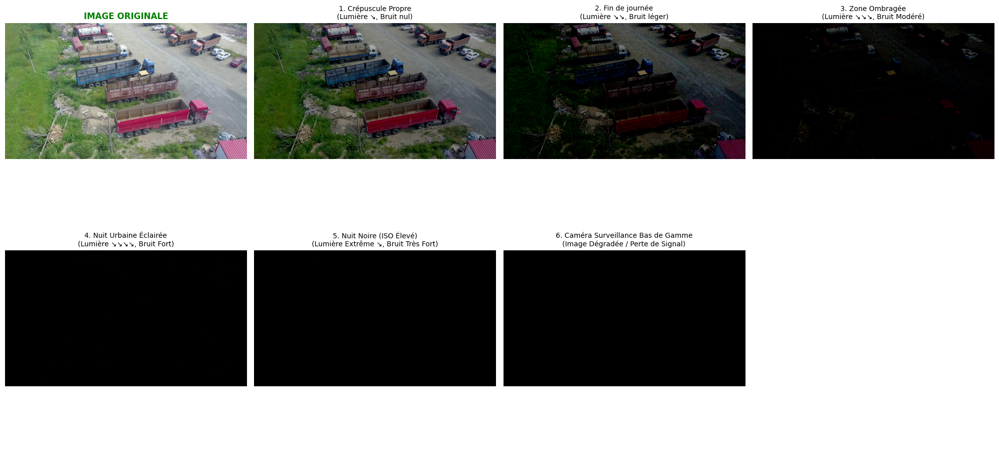

In [1]:
import albumentations as A
import cv2
import matplotlib.pyplot as plt
import os
# ==========================================
# CHARGEMENT DE VOTRE IMAGE
# ==========================================
# Remplacez par le chemin de votre image (PNG, JPG, etc.)
image_path = "/kaggle/input/datasets/kushagrapandya/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/images/0000008_01999_d_0000040.jpg"

IMAGE_PATH = "/kaggle/input/datasets/kushagrapandya/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/images/0000002_00005_d_0000014.jpg" 
IMAGE_PATH = image_path
if not os.path.exists(IMAGE_PATH):
    raise FileNotFoundError(f"L'image '{IMAGE_PATH}' est introuvable. Vérifiez le chemin.")
# Lecture avec OpenCV et conversion BGR -> RGB
image_bgr = cv2.imread(IMAGE_PATH)
image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
# ==========================================
# LES 6 CONFIGURATIONS DE FAIBLE LUMINOSITÉ
# ==========================================
configs = {
    "1. Crépuscule Propre\n(Lumière ↘, Bruit nul)": A.Compose([
        A.RandomBrightnessContrast(brightness_limit=(-0.2, -0.2), contrast_limit=(-0.1, -0.1), p=1.0)
    ]),

    "2. Fin de journée\n(Lumière ↘↘, Bruit léger)": A.Compose([
        A.RandomBrightnessContrast(brightness_limit=(-0.35, -0.35), contrast_limit=(-0.15, -0.15), p=1.0),
        A.ShotNoise(scale_range=(0.03, 0.03), p=1.0)
    ]),

    "3. Zone Ombragée\n(Lumière ↘↘↘, Bruit Modéré)": A.Compose([
        A.RandomBrightnessContrast(brightness_limit=(-0.5, -0.5), contrast_limit=(-0.2, -0.2), p=1.0),
        A.ShotNoise(scale_range=(0.07, 0.07), p=1.0),
        A.ColorJitter(saturation=(0.90, 0.90), hue=0, p=1.0)
    ]),

    "4. Nuit Urbaine Éclairée\n(Lumière ↘↘↘↘, Bruit Fort)": A.Compose([
        A.RandomBrightnessContrast(brightness_limit=(-0.65, -0.65), contrast_limit=(-0.25, -0.25), p=1.0),
        A.ShotNoise(scale_range=(0.14, 0.14), p=1.0),
        A.ColorJitter(saturation=(0.80, 0.80), hue=0, p=1.0)
    ]),

    "5. Nuit Noire (ISO Élevé)\n(Lumière Extrême ↘, Bruit Très Fort)": A.Compose([
        A.RandomBrightnessContrast(brightness_limit=(-0.75, -0.75), contrast_limit=(-0.35, -0.35), p=1.0),
        A.ShotNoise(scale_range=(0.25, 0.25), p=1.0),
        A.ColorJitter(saturation=(0.60, 0.60), hue=0, p=1.0)
    ]),

    "6. Caméra Surveillance Bas de Gamme\n(Image Dégradée / Perte de Signal)": A.Compose([
        A.RandomBrightnessContrast(brightness_limit=(-0.85, -0.85), contrast_limit=(-0.4, -0.4), p=1.0),
        A.ShotNoise(scale_range=(0.4, 0.4), p=1.0),
        A.ColorJitter(saturation=(0.40, 0.40), hue=0, p=1.0)
    ])
}
# ==========================================
# AFFICHAGE DES RÉSULTATS
# ==========================================
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.ravel()
# Image Originale
axes[0].imshow(image)
axes[0].set_title("IMAGE ORIGINALE", fontsize=12, fontweight='bold', color='green')
axes[0].axis('off')
# Application des 6 configurations
for idx, (title, transform) in enumerate(configs.items(), start=1):
    augmented = transform(image=image)
    axes[idx].imshow(augmented["image"])
    axes[idx].set_title(title, fontsize=10)
    axes[idx].axis('off')
# Masquer la dernière case vide de la grille 2x4
axes[7].axis('off')
plt.tight_layout()
plt.show()

Retenu pour le moment mais à améliorer plus tard - Pour la pluie

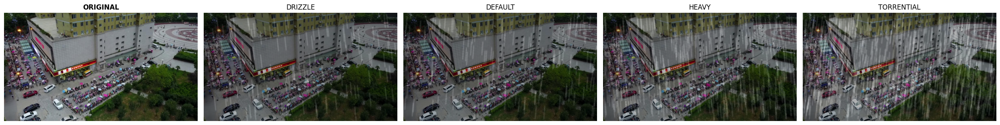

Comparaison sauvegardée : rain_test_comparison.jpg


In [5]:
# ================================================================
# TEST RAPIDE : A.RandomRain sur une vraie image
# ================================================================

import albumentations as A
import cv2
import matplotlib.pyplot as plt

# >>> CHANGE THIS PATH <<<
IMAGE_PATH = "/kaggle/input/datasets/kushagrapandya/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/images/0000002_00448_d_0000015.jpg"

image_bgr = cv2.imread(IMAGE_PATH)
image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

rain_types = ["drizzle", "default", "heavy", "torrential"]

fig, axes = plt.subplots(1, 5, figsize=(25, 6))

axes[0].imshow(image)
axes[0].set_title("ORIGINAL", fontsize=12, fontweight="bold")
axes[0].axis("off")

for ax, rain_type in zip(axes[1:], rain_types):

    transform = A.RandomRain(rain_type=rain_type, p=1.0)
    result = transform(image=image)["image"]

    ax.imshow(result)
    ax.set_title(rain_type.upper(), fontsize=12)
    ax.axis("off")

plt.tight_layout()
plt.savefig("rain_test_comparison.jpg", dpi=150)
plt.show()

print("Comparaison sauvegardée : rain_test_comparison.jpg")

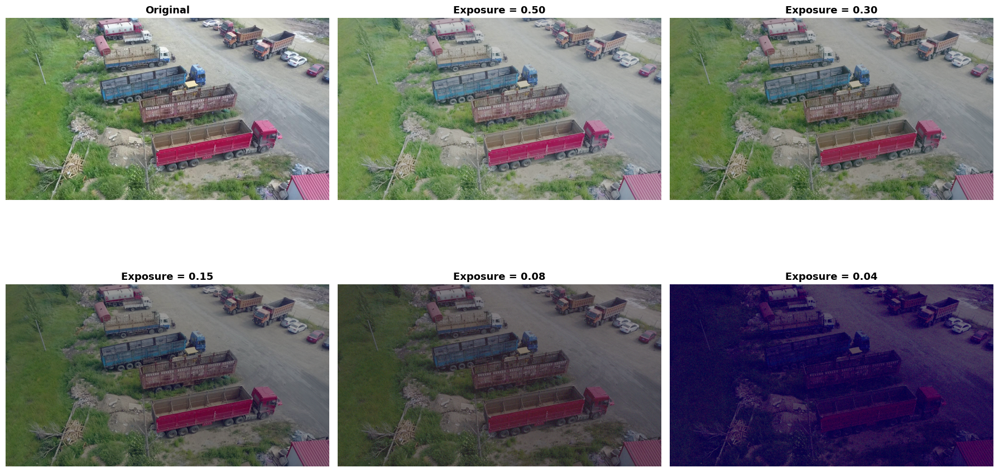

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Low-Light Synthétique — modèle physique simplifié RAW/ISP
# Paramètres continus : exposure, gain, noise, illumination
# ============================================================

def srgb_to_linear(img):
    x = img.astype(np.float32) / 255.0
    return np.where(x <= 0.04045, x / 12.92, ((x + 0.055) / 1.055) ** 2.4).astype(np.float32)

def linear_to_srgb(img):
    x = np.clip(img, 0, 1)
    return np.where(x <= 0.0031308, 12.92 * x, 1.055 * np.power(x, 1 / 2.4) - 0.055).astype(np.float32)

def generate_illumination_field(h, w, strength, rng):
    if strength <= 0:
        return np.ones((h, w), dtype=np.float32)

    gh, gw = max(4, h // 80), max(4, w // 80)
    noise = rng.normal(0, 1, (gh, gw)).astype(np.float32)
    noise = cv2.GaussianBlur(noise, (0, 0), sigmaX=2, sigmaY=2)
    field = cv2.resize(noise, (w, h), interpolation=cv2.INTER_CUBIC)
    field /= field.std() + 1e-6
    illumination = np.exp(strength * 0.45 * field)
    illumination /= illumination.mean()
    return illumination.astype(np.float32)

def generate_lowlight(image_bgr, exposure=0.15, gain=4.0, noise=1.0, illumination=0.20, seed=None):
    rng = np.random.default_rng(seed)
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    h, w = image_rgb.shape[:2]

    # sRGB -> espace linéaire
    clean = srgb_to_linear(image_rgb)

    # Réduction de la quantité de lumière
    signal = clean * exposure

    # Illumination non uniforme
    field = generate_illumination_field(h, w, illumination, rng)
    signal *= field[..., None]
    signal = np.clip(signal, 0, 1)

    # ========================================================
    # Modèle d'acquisition photonique
    # ========================================================
    # Le nombre de photons capturés diminue avec l'exposition.
    # Le gain amplifie ensuite le signal et le bruit.
    full_well = 20000.0
    photons = np.clip(signal * full_well, 0, None)

    shot = rng.poisson(photons).astype(np.float32)
    raw = shot / full_well

    # Bruit de lecture
    read_sigma = 0.0015 * noise
    raw += rng.normal(0, read_sigma, raw.shape).astype(np.float32)

    # Bruit électronique dépendant du gain
    gain_noise = 0.0008 * np.sqrt(max(gain, 1.0)) * noise
    raw += rng.normal(0, gain_noise, raw.shape).astype(np.float32)

    # Amplification analogique
    raw *= gain

    # Compensation simple de l'amplification pour conserver
    # une exposition visuelle cohérente
    raw /= gain

    raw = np.clip(raw, 0, 1)

    # ========================================================
    # Bruit chromatique léger
    # ========================================================
    chroma_sigma = 0.0012 * noise * np.sqrt(max(gain, 1.0))
    channel_noise = rng.normal(0, chroma_sigma, (1, 1, 3)).astype(np.float32)
    raw += channel_noise

    raw = np.clip(raw, 0, 1)

    # ========================================================
    # ISP simplifié
    # ========================================================
    # Petite variation de balance des blancs induite par le gain.
    wb_strength = min(0.025 * noise * np.sqrt(max(gain, 1.0)), 0.08)
    wb = np.array([
        1.0 + rng.uniform(-wb_strength, wb_strength),
        1.0 + rng.uniform(-wb_strength * 0.5, wb_strength * 0.5),
        1.0 + rng.uniform(-wb_strength, wb_strength)
    ], dtype=np.float32)

    raw *= wb[None, None, :]
    raw /= wb.mean()
    raw = np.clip(raw, 0, 1)

    # Rendu tonal
    processed = raw / (raw + 0.35)
    processed = np.power(np.clip(processed, 0, 1), 0.95)

    # Linéaire -> sRGB
    output_rgb = linear_to_srgb(processed)
    output_rgb = np.clip(output_rgb * 255, 0, 255).astype(np.uint8)

    return cv2.cvtColor(output_rgb, cv2.COLOR_RGB2BGR)


# ============================================================
# Charger l'image VisDrone
# ============================================================

image_path = "/kaggle/input/datasets/kushagrapandya/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/images/0000008_01999_d_0000040.jpg"
image = cv2.imread(image_path, cv2.IMREAD_COLOR)

if image is None:
    raise FileNotFoundError(f"Impossible de charger : {image_path}")


# ============================================================
# Génération — paramètres numériques continus
# ============================================================

low_1 = generate_lowlight(image, exposure=0.50, gain=1.5, noise=0.5, illumination=0.05, seed=2026)
low_2 = generate_lowlight(image, exposure=0.30, gain=2.0, noise=0.8, illumination=0.10, seed=2026)
low_3 = generate_lowlight(image, exposure=0.15, gain=4.0, noise=1.0, illumination=0.20, seed=2026)
low_4 = generate_lowlight(image, exposure=0.08, gain=8.0, noise=1.5, illumination=0.30, seed=2026)
low_5 = generate_lowlight(image, exposure=0.04, gain=12.0, noise=2.0, illumination=0.40, seed=2026)


# ============================================================
# Affichage
# ============================================================

images = [image, low_1, low_2, low_3, low_4, low_5]
titles = [
    "Original",
    "Exposure = 0.50",
    "Exposure = 0.30",
    "Exposure = 0.15",
    "Exposure = 0.08",
    "Exposure = 0.04"
]

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
axes = axes.ravel()

for ax, img, title in zip(axes, images, titles):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(title, fontsize=13, fontweight="bold")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
from pathlib import Path
import sys

import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display
from PIL import Image

# Racine du projet
PROJECT_ROOT = Path.cwd()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

sys.path.insert(0, str(PROJECT_ROOT))

from src.degradation.lowlight import LowlightGenerator


# Charge et redimensionne l'image
image_path = PROJECT_ROOT / "data/degradation_test/original.jpg"
loaded_image = Image.open(image_path).convert("RGB")
loaded_image.thumbnail((1280, 1280), Image.Resampling.LANCZOS)
image = np.asarray(loaded_image)

print(f"Image chargee : {image.shape[1]}x{image.shape[0]}")


# Curseurs
brightness = widgets.FloatSlider(
    value=-0.2,
    min=-1.0,
    max=0.0,
    step=0.01,
    description="Luminosite",
    continuous_update=False,
)

contrast = widgets.FloatSlider(
    value=-0.4,
    min=-1.0,
    max=0.0,
    step=0.01,
    description="Contraste",
    continuous_update=False,
)

shot_noise = widgets.FloatSlider(
    value=0.0,
    min=0.0,
    max=0.5,
    step=0.01,
    description="Bruit",
    continuous_update=False,
)

saturation = widgets.FloatSlider(
    value=0.2,
    min=0.0,
    max=1.0,
    step=0.01,
    description="Saturation",
    continuous_update=False,
)

seed = widgets.IntSlider(
    value=42,
    min=0,
    max=9999,
    step=1,
    description="Seed",
    continuous_update=False,
)

reset_button = widgets.Button(description="Reinitialiser")


def update_preview(
    brightness_value,
    contrast_value,
    noise_value,
    saturation_value,
    seed_value,
):
    result = LowlightGenerator.apply_with_range(
        image=image,
        brightness_limit=(brightness_value, brightness_value),
        contrast_limit=(contrast_value, contrast_value),
        shot_noise_scale=noise_value,
        saturation=saturation_value,
        seed=seed_value,
    )

    figure, axes = plt.subplots(1, 2, figsize=(14, 6))

    axes[0].imshow(image)
    axes[0].set_title("Originale")
    axes[0].axis("off")

    axes[1].imshow(result)
    axes[1].set_title("Faible luminosite")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()


def reset_values(_):
    brightness.value = -0.2
    contrast.value = -0.4
    shot_noise.value = 0.0
    saturation.value = 0.2
    seed.value = 42


reset_button.on_click(reset_values)

controls = widgets.VBox(
    [
        brightness,
        contrast,
        shot_noise,
        saturation,
        seed,
        reset_button,
    ]
)

preview = widgets.interactive_output(
    update_preview,
    {
        "brightness_value": brightness,
        "contrast_value": contrast,
        "noise_value": shot_noise,
        "saturation_value": saturation,
        "seed_value": seed,
    },
)

display(widgets.HBox([controls, preview]))

Image chargee : 1280x720
